In [2]:
from scipy import signal
import numpy as np
from scipy.fftpack import fft, ifft, ifftshift, fftshift
import matplotlib.pyplot as plt
from scipy.io.wavfile import read
from IPython.lib.display import Audio
import os
pi = np.pi

%matplotlib widget

## Reading Signals

In [3]:
Fs1, x1 = read("civciv1.wav")
Fs2, x2 = read("civciv2.wav")
Fs3, x3 = read("civciv3.wav")

Fs4, x4 = read("tavuk1.wav")
Fs5, x5 = read("tavuk2.wav")
Fs6, x6 = read("tavuk3.wav")

x1 = x1[:int(x1.size/4)]
x2 = x2[:int(x2.size/4)]
x3 = x3[:int(x3.size/4)]

x4 = x4[:int(x4.size/4)]
x5 = x5[:int(x5.size/4)]
x6 = x6[:int(x6.size/4)]

/tmp/ipykernel_5401/42641193.py:1: WavFileWarning: Chunk (non-data) not understood, skipping it.
  Fs1, x1 = read("civciv1.wav")
/tmp/ipykernel_5401/42641193.py:2: WavFileWarning: Chunk (non-data) not understood, skipping it.
  Fs2, x2 = read("civciv2.wav")
/tmp/ipykernel_5401/42641193.py:3: WavFileWarning: Chunk (non-data) not understood, skipping it.
  Fs3, x3 = read("civciv3.wav")
/tmp/ipykernel_5401/42641193.py:5: WavFileWarning: Chunk (non-data) not understood, skipping it.
  Fs4, x4 = read("tavuk1.wav")
/tmp/ipykernel_5401/42641193.py:6: WavFileWarning: Chunk (non-data) not understood, skipping it.
  Fs5, x5 = read("tavuk2.wav")
/tmp/ipykernel_5401/42641193.py:7: WavFileWarning: Chunk (non-data) not understood, skipping it.
  Fs6, x6 = read("tavuk3.wav")


In [4]:
print(x1.shape) # x'in boyut bilgisi
print(Fs1)

print(x2.shape) # x'in boyut bilgisi
print(Fs2)



(661500,)
44100
(661500,)
44100


## Sounds

In [5]:
print("civciv 1") ; display(Audio(x1, rate=Fs1))
print("civciv 2") ; display(Audio(x2, rate=Fs2)) 
print("civciv 3") ; display(Audio(x3, rate=Fs3)) 
print("tavuk 1")  ; display(Audio(x4, rate=Fs4)) 
print("tavuk 2")  ; display(Audio(x5, rate=Fs5)) 
print("tavuk 3")  ; display(Audio(x6, rate=Fs6)) 

civciv 1


civciv 2


civciv 3


tavuk 1


tavuk 2


tavuk 3


## Spectrums

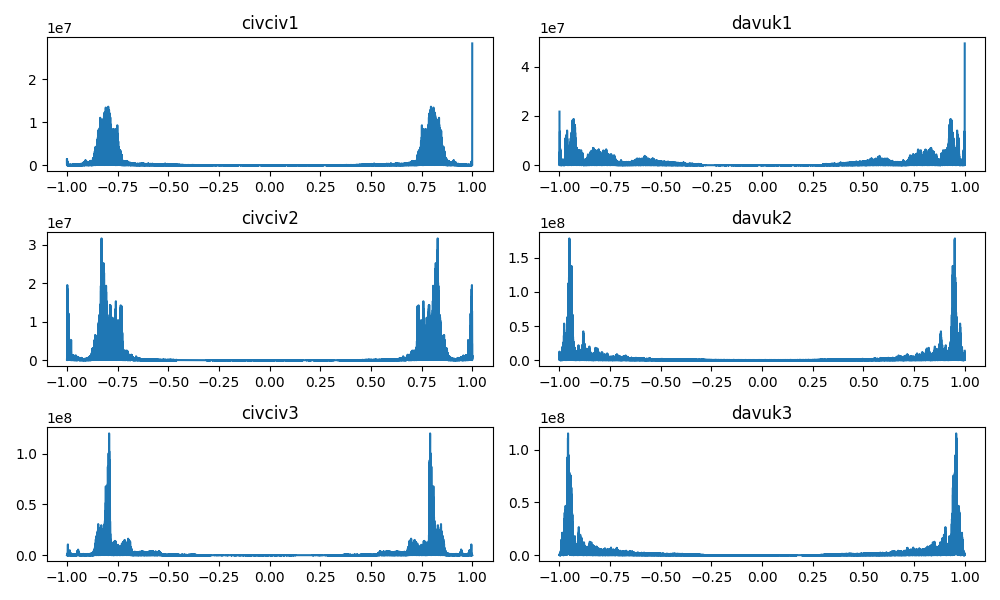

In [6]:
N= x1.size
w =np.linspace(pi , -pi, N)

x1_W = fft(x1, N) 
x2_W = fft(x2, N) 
x3_W = fft(x3, N) 

x4_W = fft(x4, N)
x5_W = fft(x5, N) 
x6_W = fft(x6, N)

plt.figure(figsize = (10,6))

plt.subplot(3,2,1); plt.plot(w/pi, abs(x1_W))
plt.title("civciv1")

plt.subplot(3,2,3); plt.plot(w/pi, abs(x2_W))
plt.title("civciv2")

plt.subplot(3,2,5); plt.plot(w/pi, abs(x3_W))
plt.title("civciv3")

plt.subplot(3,2,2); plt.plot(w/pi, abs(x4_W))
plt.title("davuk1")

plt.subplot(3,2,4); plt.plot(w/pi, abs(x5_W))
plt.title("davuk2")

plt.subplot(3,2,6); plt.plot(w/pi, abs(x6_W))
plt.title("davuk3")

plt.tight_layout()

## Power Spectral Density

Text(0, 0.5, 'Power/Frequency (dB/(rad/sample))')

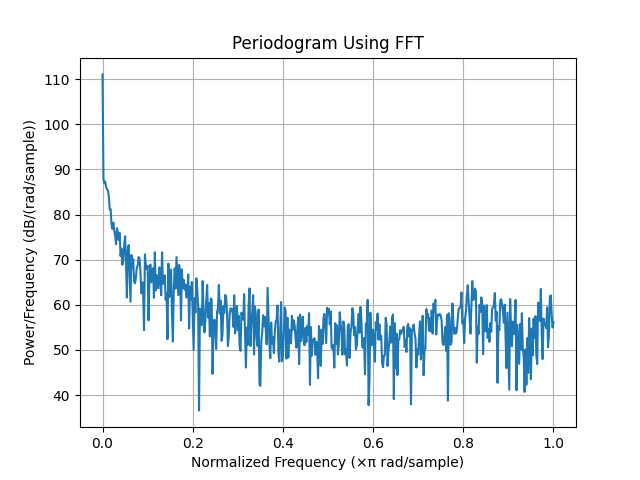

In [10]:
## ONLY FOR X1
N = 1000
n = np.arange(N)
x = np.cos(np.pi / 4 * n) + np.random.randn(N)

psdx = (1 / (2 * np.pi * N)) * np.abs(x1_W[:N//2+1]) ** 2
psdx[1:-1] = 2 * psdx[1:-1]
freq = np.linspace(0, np.pi, N//2+1)

plt.figure()
plt.plot(freq / np.pi, 10 * np.log10(psdx))
plt.grid(True)
plt.title("Power Spectral Density")
plt.xlabel("Normalized Frequency (×π rad/sample)")
plt.ylabel("Power/Frequency (dB/(rad/sample))")


## Mixing Signals and Applying Ideal Filter

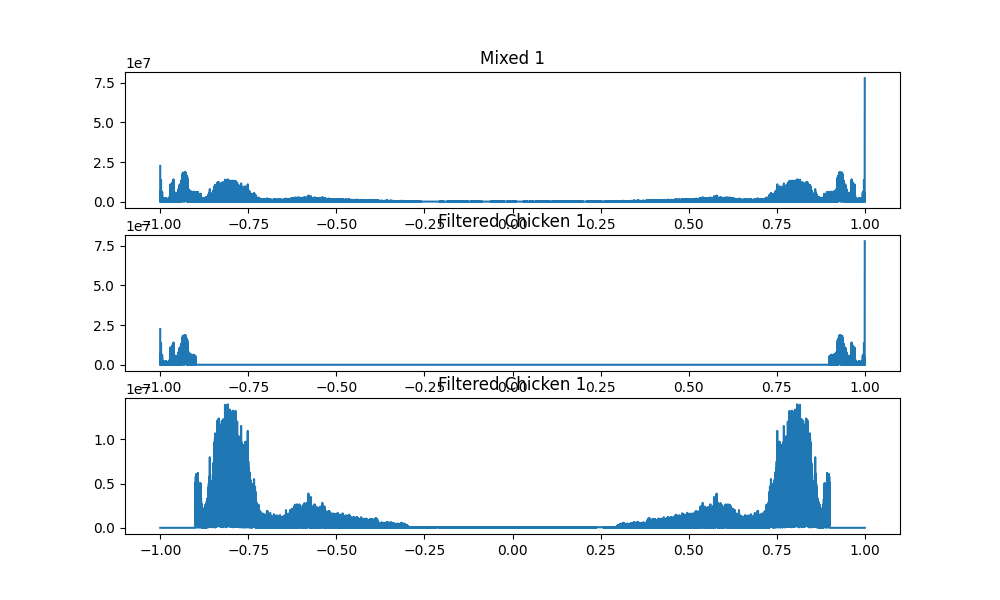

In [8]:
mixed_1 = x1 + x4
display(Audio(mixed_1, rate=Fs1))

mixed_1_W = fft(mixed_1, N) 

plt.figure(figsize = (10,6))
plt.subplot(3,1,1); plt.plot(w/pi, np.abs(mixed_1_W))
plt.title("Mixed 1")


filtered_chicken_w =np.where(abs(w)>0.9*pi, mixed_1_W, 0)
filtered_chick_w =np.where(abs(w)<0.9*pi, mixed_1_W, 0)


plt.subplot(3,1,2); plt.plot(w/pi, np.abs(filtered_chicken_w))
plt.title("Filtered Chicken 1")

plt.subplot(3,1,3); plt.plot(w/pi, np.abs(filtered_chick_w))
plt.title("Filtered Chicken 1")

filtered_chicken_t = ifft(filtered_chicken_w).real
filtered_chick_t = ifft(filtered_chick_w).real

display(Audio(filtered_chicken_t, rate=Fs1))
display(Audio(filtered_chick_t, rate=Fs1))
